In [167]:
#Importing packages
from nltk import pos_tag
from nltk.corpus import wordnet
from sklearn.naive_bayes import MultinomialNB
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from transformers import AutoModelForSequenceClassification
from transformers import AutoTokenizer
from scipy.special import softmax
import torch
from gensim.corpora import Dictionary
from gensim.models.ldamodel import LdaModel
from gensim.models.coherencemodel import CoherenceModel
from pprint import pprint
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import logging
from tqdm import tqdm
from sklearn import metrics
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
import pandas as pd
import re
import nltk
from nltk.stem import WordNetLemmatizer
import time
from collections import Counter
from nltk import bigrams
from collections import defaultdict
import random
from collections import defaultdict
import random
from nltk.util import ngrams

#### Useful Functions

In [84]:
def plot_confusion_matrix(y_true, y_pred):
    # Generate the confusion matrix
    confusion_matrix = metrics.confusion_matrix(y_true, y_pred)

    # Plot the confusion matrix
    plt.figure(figsize=(8, 6))
    plt.imshow(confusion_matrix, interpolation='nearest', cmap='Greens')

    # Add the numbers on the confusion matrix
    thresh = confusion_matrix.max() / 2.
    for i in range(confusion_matrix.shape[0]):
        for j in range(confusion_matrix.shape[1]):
            plt.text(j, i, format(confusion_matrix[i, j], 'd'),
                     horizontalalignment="center",
                     color="white" if confusion_matrix[i, j] > thresh else "black")

    plt.colorbar()
    tick_marks = np.arange(len(list(set(y_true))))
    plt.xticks(tick_marks, list(set(y_true)), rotation=45)
    plt.yticks(tick_marks, list(set(y_true)))
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title('Confusion Matrix')

    plt.show()

# Preprocessing Raw Dataset

In [ ]:
start_time = time.time()

df1 = pd.read_csv('Twitter_Dataset_Raw.csv')

# Concatenate the dataframes
data_frames = [df1]
for i in data_frames:
    print(len(i))
df = pd.concat(data_frames)
df = df.reset_index(drop=True)

# Filter for language
df = df[df['Language'] == 'en']
df.shape

# Clean data for EDA
df.info()

# Drop columns not useful for our work
df.drop(columns=['Retweeted', 'Timestamp', "UserId", "UserName", "Verified", "Location", "Followers", "Language"], inplace=True)

dtypes = {'Tweet': str}
df.head()

# DATA PREPROCESSING
df.info()

# Remove URL from tweet text
df['Tweet'] = df['Tweet'].apply(lambda x: re.sub(r'http\S+', '', x))
print('URL Removed!')
# Remove mention (@user)
df['Tweet'] = df['Tweet'].apply(lambda x: re.sub(r'@\w+', '', x))
print('Mention Removed!')
# All lowercases
df['Tweet'] = df['Tweet'].apply(lambda x: ' '.join(x.lower() for x in x.split()))
print('Lowercase Done!')
# Remove Punctuation
df['Tweet_punc'] = df['Tweet'].apply(lambda x: re.sub('[^\w\s]', '', x))
print('Punctuation Removed!')
# Replace 'chat gpt' with 'chatgpt'
df['Tweet_punc'] = df['Tweet_punc'].apply(lambda x: re.sub(r'chat gpt', 'chatgpt', x))
print('Replacement Done!')

# Download stopwords
nltk.download('stopwords')

# Apply stopwords removal
df['Tweet_stop'] = df['Tweet_punc'].apply(lambda x: ' '.join(x for x in x.split() if x not in stopwords.words('english')))
print('Stopwords Removed!')

# Tokenization
df['Tweet_tokenized'] = df['Tweet_stop'].apply(lambda x: re.split('\W+', x))
print('Tokenization Done!')

# Lemmatization
nltk.download('wordnet')
nltk.download('omw-1.4')

wnl = WordNetLemmatizer()

def get_wordnet(pos):
    if pos.startswith('N'):
        return wordnet.NOUN
    elif pos.startswith('V'):
        return wordnet.VERB
    elif pos.startswith('J'):
        return wordnet.ADJ
    elif pos.startswith('R'):
        return wordnet.ADV
    else:
        return wordnet.NOUN

def lemmatizer(text):
    pos_tags = pos_tag(text)
    text = [wnl.lemmatize(word, pos=get_wordnet(pos)) for word, pos in pos_tags]
    return text

df['Tweet_lemmatized'] = df['Tweet_tokenized'].apply(lambda x: lemmatizer(x))
print('Lemmatization w/Lemmatizer Done!')

df_clean = df.drop(columns=['Tweet', 'Tweet_punc', 'Tweet_stop', 'Tweet_tokenized'])

df_clean['Tokens'] = df_clean['Tweet_lemmatized'].apply(lambda x: ' '.join(x))

df_clean.to_csv('Twitter_Dataset_Processed.csv', index=False)

end_time = time.time()
execution_time = end_time - start_time
print("Execution Time:", execution_time, "seconds")

<>:38: DeprecationWarning: invalid escape sequence \w
<>:52: DeprecationWarning: invalid escape sequence \W
<>:38: DeprecationWarning: invalid escape sequence \w
<>:52: DeprecationWarning: invalid escape sequence \W
C:\Users\lucac\AppData\Local\Temp\ipykernel_20060\1686338199.py:38: DeprecationWarning: invalid escape sequence \w
  df['Tweet_punc'] = df['Tweet'].apply(lambda x: re.sub('[^\w\s]', '', x))
C:\Users\lucac\AppData\Local\Temp\ipykernel_20060\1686338199.py:52: DeprecationWarning: invalid escape sequence \W
  df['Tweet_tokenized'] = df['Tweet_stop'].apply(lambda x: re.split('\W+', x))
C:\Users\lucac\AppData\Local\Temp\ipykernel_20060\1686338199.py:3: DtypeWarning: Columns (2) have mixed types. Specify dtype option on import or set low_memory=False.
  df1 = pd.read_csv('Twitter_Dataset_Raw.csv')


100164
<class 'pandas.core.frame.DataFrame'>
Int64Index: 47565 entries, 0 to 100163
Data columns (total 9 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   UserId     47565 non-null  float64
 1   UserName   47565 non-null  object 
 2   Verified   47565 non-null  object 
 3   Location   34410 non-null  object 
 4   Followers  47565 non-null  float64
 5   Tweet      47565 non-null  object 
 6   Timestamp  47565 non-null  object 
 7   Retweeted  0 non-null      float64
 8   Language   47565 non-null  object 
dtypes: float64(3), object(6)
memory usage: 3.6+ MB
<class 'pandas.core.frame.DataFrame'>
Int64Index: 47565 entries, 0 to 100163
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Tweet   47565 non-null  object
dtypes: object(1)
memory usage: 743.2+ KB
URL Removed!
Mention Removed!
Lowercase Done!
Punctuation Removed!
Replacement Done!


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\lucac\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


KeyboardInterrupt: 

### EDA on Preprocessed Data

In [85]:
#Preprocessed data
data = pd.read_csv('Twitter_Dataset_Processed.csv')

In [86]:
data

,Tweet_lemmatized,Tweet_lemmatized_spacy,Tokens
0,"['best', 'ai', 'write', 'assistant', '2023', '...","['good', 'ai', 'write', 'assistant', '2023', '...",best ai write assistant 2023 chatgpt amp bingc...
1,"['rt', 'interview', 'phocuswire', 'rajnish', '...","['rt', 'interview', 'phocuswire', 'rajnish', '...",rt interview phocuswire rajnish kumar cofounde...
2,"['discuss', 'internet', 'chatgpt', 'ai', 'defo...","['discuss', 'internet', 'chatgpt', 'ai', 'defo...",discuss internet chatgpt ai deformity discours...
3,"['late', 'ai', 'news', 'dont', 'want', 'sad', ...","['late', 'ai', 'news', 'do', 'not', 'want', 's...",late ai news dont want sad poor response bos d...
4,"['well', 'say', 'u', 'frontline', 'implementat...","['well', 'say', 'we', 'frontline', 'implementa...",well say u frontline implementation bridge gap...
...,...,...,...
47560,"['use', 'reinforcement', 'learn', 'algorithm',...","['use', 'reinforcement', 'learn', 'algorithm',...",use reinforcement learn algorithm proximal pol...
47561,"['chatgpt', 'train', 'massive', 'amount', 'dat...","['chatgpt', 'train', 'massive', 'amount', 'dat...",chatgpt train massive amount data gather inter...
47562,"['turn', 'kitchen', 'chaos', 'culinary', 'magi...","['turn', 'kitchen', 'chaos', 'culinary', 'magi...",turn kitchen chaos culinary magic symphchef en...
47563,"['chatgpt', 'kill', 'nft']","['chatgpt', 'kill', 'nft']",chatgpt kill nft


In [87]:
def string_converter(tweet):
    tweet_1 = tweet.strip("[]")
    tweet_2 = tweet_1.split(", ")
    lst = [element.strip("'") for element in tweet_2]
    return lst

In [88]:
data['Tweet_lemmatized'] = data['Tweet_lemmatized'].apply(string_converter)

In [89]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47565 entries, 0 to 47564
Data columns (total 3 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   Tweet_lemmatized        47565 non-null  object
 1   Tweet_lemmatized_spacy  47565 non-null  object
 2   Tokens                  47555 non-null  object
dtypes: object(3)
memory usage: 1.1+ MB


In [90]:
#data.to_csv('Twitter_Dataset_Processed_forRobby.csv', index=False)

In [91]:
#Counting different elements between Tweet_lemmatized
count = 0
for i, j in zip(data['Tweet_lemmatized'], data['Tweet_lemmatized_spacy']):
    if i != j:
        count += 1
print(count)

47565


### Labelling with Lexicon VADER

In [92]:
sia = SentimentIntensityAnalyzer()

In [93]:
def labeller(sentence):
    sentence = ' '.join(sentence)
    #print(sentence)
    sentiment_scores = sia.polarity_scores(sentence)
    compound_score = sentiment_scores['compound']
    #print(sentiment_scores['compound'])
    if compound_score > 0.25:
        return 'Positive'
    elif compound_score < -0.25:
        return 'Negative'
    else:
        return 'Neutral'

In [94]:
data['Sentiment_lemm'] = data['Tweet_lemmatized'].apply(labeller)

In [95]:
data

,Tweet_lemmatized,Tweet_lemmatized_spacy,Tokens,Sentiment_lemm
0,"[best, ai, write, assistant, 2023, chatgpt, am...","['good', 'ai', 'write', 'assistant', '2023', '...",best ai write assistant 2023 chatgpt amp bingc...,Positive
1,"[rt, interview, phocuswire, rajnish, kumar, co...","['rt', 'interview', 'phocuswire', 'rajnish', '...",rt interview phocuswire rajnish kumar cofounde...,Neutral
2,"[discuss, internet, chatgpt, ai, deformity, di...","['discuss', 'internet', 'chatgpt', 'ai', 'defo...",discuss internet chatgpt ai deformity discours...,Negative
3,"[late, ai, news, dont, want, sad, poor, respon...","['late', 'ai', 'news', 'do', 'not', 'want', 's...",late ai news dont want sad poor response bos d...,Positive
4,"[well, say, u, frontline, implementation, brid...","['well', 'say', 'we', 'frontline', 'implementa...",well say u frontline implementation bridge gap...,Neutral
...,...,...,...,...
47560,"[use, reinforcement, learn, algorithm, proxima...","['use', 'reinforcement', 'learn', 'algorithm',...",use reinforcement learn algorithm proximal pol...,Positive
47561,"[chatgpt, train, massive, amount, data, gather...","['chatgpt', 'train', 'massive', 'amount', 'dat...",chatgpt train massive amount data gather inter...,Neutral
47562,"[turn, kitchen, chaos, culinary, magic, symphc...","['turn', 'kitchen', 'chaos', 'culinary', 'magi...",turn kitchen chaos culinary magic symphchef en...,Positive
47563,"[chatgpt, kill, nft]","['chatgpt', 'kill', 'nft']",chatgpt kill nft,Negative


In [96]:
data['Sentiment_lemm'].value_counts()

Positive    21340
Neutral     21075
Negative     5150
Name: Sentiment_lemm, dtype: int64

### Train Test Splitting

In [97]:
tweets = data['Tweet_lemmatized'].apply(' '.join)

In [98]:
xTrain, xTest, yTrain, yTest = train_test_split(tweets, data['Sentiment_lemm'], test_size=0.2, random_state=42)

# N-Gram Model

In [170]:
data

,Tweet_lemmatized,Tweet_lemmatized_spacy,Tokens,Sentiment_lemm,Sentiment_VADER
0,"[best, ai, write, assistant, 2023, chatgpt, amp, bingchat, integrated, gpt4, try, free, see, one, work, best, aiwriting, contentcreation]","['good', 'ai', 'write', 'assistant', '2023', 'chatgpt', 'amp', 'bingchat', 'integrate', 'gpt4', 'try', 'free', 'see', 'one', 'work', 'well', 'aiwrite', 'contentcreation']",best ai write assistant 2023 chatgpt amp bingchat integrated gpt4 try free see one work best aiwriting contentcreation,Positive,Positive
1,"[rt, interview, phocuswire, rajnish, kumar, cofounder, group, chief, product, technology, officer, speak, companys, early, artificialintelligence, development, potential, use, case, chatgpt, current, chal]","['rt', 'interview', 'phocuswire', 'rajnish', 'kumar', 'cofounder', 'group', 'chief', 'product', 'technology', 'officer', 'speak', 'company', 'early', 'artificialintelligence', 'development', 'potential', 'use', 'case', 'chatgpt', 'current', 'chal']",rt interview phocuswire rajnish kumar cofounder group chief product technology officer speak companys early artificialintelligence development potential use case chatgpt current chal,Neutral,Neutral
2,"[discuss, internet, chatgpt, ai, deformity, discourse, likely, drive, social, medium, matter, doom]","['discuss', 'internet', 'chatgpt', 'ai', 'deformity', 'discourse', 'likely', 'drive', 'social', 'medium', 'matter', 'doom']",discuss internet chatgpt ai deformity discourse likely drive social medium matter doom,Negative,Negative
3,"[late, ai, news, dont, want, sad, poor, response, bos, demand, extra, shift, use, chatgpt, write, formal, email, behalf, decline]","['late', 'ai', 'news', 'do', 'not', 'want', 'sad', 'poor', 'response', 'boss', 'demand', 'extra', 'shift', 'use', 'chatgpt', 'write', 'formal', 'email', 'behalf', 'decline']",late ai news dont want sad poor response bos demand extra shift use chatgpt write formal email behalf decline,Positive,Positive
4,"[well, say, u, frontline, implementation, bridge, gap, would, foolish, u, expect, figure, ive, see, demand, prediction, model, chatgpt, make, go, crazy, hype, haha]","['well', 'say', 'we', 'frontline', 'implementation', 'bridge', 'gap', 'would', 'foolish', 'we', 'expect', 'figure', 'I', 've', 'see', 'demand', 'prediction', 'model', 'chatgpt', 'make', 'go', 'crazy', 'hype', 'haha']",well say u frontline implementation bridge gap would foolish u expect figure ive see demand prediction model chatgpt make go crazy hype haha,Neutral,Neutral
...,...,...,...,...,...
47560,"[use, reinforcement, learn, algorithm, proximal, policy, optimization, optimize, policy, training, model, reward, model, key, phase, rlhf, chatgpt, third, version, finetuned, model, gpt35, series, making, humanlike]","['use', 'reinforcement', 'learn', 'algorithm', 'proximal', 'policy', 'optimization', 'optimize', 'policy', 'training', 'model', 'reward', 'model', 'key', 'phase', 'rlhf', 'chatgpt', 'third', 'version', 'finetune', 'model', 'gpt35', 'series', 'make', 'humanlike']",use reinforcement learn algorithm proximal policy optimization optimize policy training model reward model key phase rlhf chatgpt third version finetuned model gpt35 series making humanlike,Positive,Positive
47561,"[chatgpt, train, massive, amount, data, gather, internet, source, 2021, use, reinforcement, learn, human, feedback, rlhf, contd, datascience, technology, ai, chatgpt, machinelearning]","['chatgpt', 'train', 'massive', 'amount', 'datum', 'gather', 'internet', 'source', '2021', 'use', 'reinforcement', 'learn', 'human', 'feedback', 'rlhf', 'contd', 'datascience', 'technology', 'ai', 'chatgpt', 'machinelearning']",chatgpt train massive amount data gather internet source 2021 use reinforcement learn human feedback rlhf contd datascience technology ai chatgpt machinelearning,Neutral,Neutral
47562,"[turn, kitchen, chaos, culinary, magic, symphchef, enter, ingredient, get, delicious, recipe, join, fun, symphchef, kitchenadventures, buildopenlywithai, ai30x30, t

In [175]:
# Combine all the words in the 'Tweet_lemmatized' column into a single list
all_words = [word for sublist in data['Tweet_lemmatized'] for word in eval(str(sublist))]

# Count the occurrences of each word
word_counts = Counter(all_words)

# Calculate the total number of words
total_words = len(all_words)

print('Total number of words in the Tweet_lemmatized column: ', total_words)
print("The ten most common words are:", word_counts.most_common(10))

Total number of words in the Tweet_lemmatized column:  640655
The ten most common words are: [('chatgpt', 49951), ('ai', 13864), ('use', 8630), ('like', 4176), ('write', 3670), ('get', 3538), ('ask', 3509), ('make', 3285), ('prompt', 2852), ('openai', 2531)]


### Unigram Model

In [176]:
def unigram_model(words):
    # initialize empty unigram model
    model_unigram = defaultdict(lambda: 0)

    # iterate over words in the document and count occurrences
    for word in words:
        model_unigram[word] += 1

    # convert count to probability
    total_count = float(sum(model_unigram.values()))
    for word in model_unigram:
        model_unigram[word] /= total_count

    return model_unigram

random.seed(42)  # Set the random seed for reproducibility

# Define the ratio of training and test set
train_ratio = 0.8  # 80% for training, 20% for testing

# Split the words into training and test sets based on the ratio
train_size = int(len(all_words) * train_ratio)
train_words = all_words[:train_size]
test_words = all_words[train_size:]

# Train the unigram model on the training set
model_unigram = unigram_model(train_words)

# Evaluate the unigram model on the test set
results = []

for word in test_words:
    probability = model_unigram.get(word, 0)
    results.append(probability)

# Print the probabilities of 10 words in test set
for word, probability in zip(test_words[:5], results):
    print(f"Word: {word}, Probability: {probability}")

Word: detailed, Probability: 0.0001014586633991774
Word: report, Probability: 0.000522902342134222
Word: highlight, Probability: 0.00017950378909085233
Word: much, Probability: 0.0015082220539916179
Word: text, Probability: 0.0010028798651380228


In [177]:
# Find the words with highest probabilities
top_words = sorted(set(zip(test_words, results)), key=lambda x: x[1], reverse=True)[:5]

# Print the words with highest probabilities
print("Words with highest probabilities:")
for word, probability in top_words:
    print(f"Word: {word}, Probability: {probability}")

Words with highest probabilities:
Word: chatgpt, Probability: 0.07738954663586485
Word: ai, Probability: 0.021388266695803515
Word: use, Probability: 0.013349618749560995
Word: like, Probability: 0.006526523635966315
Word: write, Probability: 0.00572851222576894


### Bigram Model

In [178]:
# Define the bigram model function
def bigram_model(words):
    model = defaultdict(lambda: defaultdict(lambda: 0))
    for word1, word2 in bigrams(words, pad_right=True, pad_left=True):
        model[word1][word2] += 1
    for w1 in model:
        total_count = float(sum(model[w1].values()))
        for w2 in model[w1]:
            if total_count == 0:
                model[w1][w2] = 0
            else:
                model[w1][w2] /= total_count
    return model


# Train and test the bigram model
# Define the ratio of training and test set
train_ratio = 0.8  # 80% for training, 20% for testing

# Split the words into training and test sets based on the ratio
train_size = int(len(all_words) * train_ratio)
train_words = all_words[:train_size]
test_words = all_words[train_size:]

# Train the bigram model on the training set
model_tweet_bigram = bigram_model(train_words)
# Generate bigrams from the test_words list
test_bigrams = list(bigrams(test_words, pad_right=True, pad_left=True))

# Randomly select 10 bigrams from the test set
num_test_bigrams = 10
selected_bigrams = random.sample(test_bigrams, num_test_bigrams)

# Test the bigram model on the selected bigrams
for word1, word2 in selected_bigrams:
    probability = model_tweet_bigram[word1][word2]
    print(f"Bigram: '{word1} {word2}', Probability: {probability}")

Bigram: 'replaces google', Probability: 0
Bigram: 'course backtests', Probability: 0
Bigram: 'use chatgpt', Probability: 0.46375328851213093
Bigram: 'notice many', Probability: 0.02666666666666667
Bigram: 'check mustsee', Probability: 0.0013850415512465374
Bigram: 'world powerful', Probability: 0.0011806375442739079
Bigram: 'block flag', Probability: 0
Bigram: 'map start', Probability: 0
Bigram: 'code need', Probability: 0.008556149732620321
Bigram: 'fix pc', Probability: 0


In [179]:
# Find the bigrams with highest probabilities
top_bigrams = sorted(set(zip(selected_bigrams, results)), key=lambda x: x[1], reverse=True)[:5]

# Print the bigrams with highest probabilities
print("Bigrams with highest probabilities:")
for bigram, probability in top_bigrams:
    print(f"Bigram: '{bigram[0]} {bigram[1]}', Probability: {probability}")

Bigrams with highest probabilities:
Bigram: 'map start', Probability: 0.021388266695803515
Bigram: 'world powerful', Probability: 0.00572851222576894
Bigram: 'code need', Probability: 0.00572851222576894
Bigram: 'notice many', Probability: 0.0015082220539916179
Bigram: 'check mustsee', Probability: 0.0010028798651380228


### Trigram Model

In [180]:
# Define the trigram model function
def trigram_model(words):
    model = defaultdict(lambda: defaultdict(lambda: defaultdict(lambda: 0)))
    for word1, word2, word3 in ngrams(words, 3, pad_right=True, pad_left=True):
        model[word1][word2][word3] += 1
    for w1 in model:
        for w2 in model[w1]:
            total_count = float(sum(model[w1][w2].values()))
            for w3 in model[w1][w2]:
                if total_count == 0:
                    model[w1][w2][w3] = 0
                else:
                    model[w1][w2][w3] /= total_count
    return model

# Train and test the trigram model
# Define the ratio of training and test set
train_ratio = 0.8  # 80% for training, 20% for testing

# Split the words into training and test sets based on the ratio
train_size = int(len(all_words) * train_ratio)
train_words = all_words[:train_size]
test_words = all_words[train_size:]

# Train the trigram model on the training set
model_tweet_trigram = trigram_model(train_words)

# Generate trigrams from the test_words list
test_trigrams = list(ngrams(test_words, 3, pad_right=True, pad_left=True))

# Randomly select 10 trigrams from the test set
num_test_trigrams = 10
selected_trigrams = random.sample(test_trigrams, num_test_trigrams)

In [181]:
# Find the trigrams with highest probabilities
top_trigrams = sorted(set(zip(selected_trigrams, results)), key=lambda x: x[1], reverse=True)[:5]

# Print the trigrams with highest probabilities
print("Trigrams with highest probabilities:")
for trigram, probability in top_trigrams:
    print(f"Trigram: '{trigram[0]} {trigram[1]} {trigram[2]}', Probability: {probability}")

Trigrams with highest probabilities:
Trigram: 'write potential know', Probability: 0.021388266695803515
Trigram: 'challenge around growth', Probability: 0.00572851222576894
Trigram: 'accountability good unless', Probability: 0.00572851222576894
Trigram: '2 one obvious', Probability: 0.0015082220539916179
Trigram: 'list top 10', Probability: 0.0010028798651380228


# Logistic Regression

Accuracy : 0.6501629349311469
              precision    recall  f1-score   support

    Negative       0.25      0.00      0.00      1007
     Neutral       0.61      0.82      0.70      4244
    Positive       0.71      0.63      0.67      4262

    accuracy                           0.65      9513
   macro avg       0.52      0.49      0.46      9513
weighted avg       0.62      0.65      0.61      9513



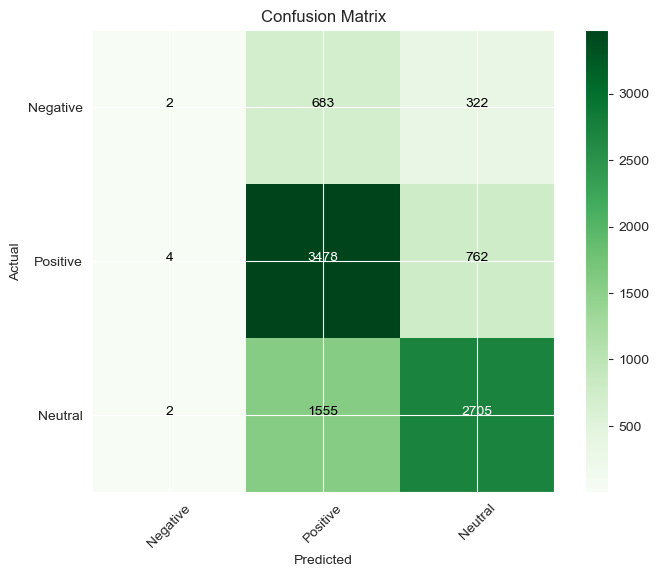

In [182]:
pipe = Pipeline([('vect', CountVectorizer(decode_error='ignore', stop_words='english', max_features=100)),
    ('tfidf', TfidfTransformer()),
    ('clf', LogisticRegression(penalty='l2', solver='lbfgs', max_iter=1000, dual=False, multi_class='multinomial', tol=1e-3))])

text = pipe.fit(xTrain, yTrain)

predictions = pipe.predict(xTest)

print('Accuracy :', accuracy_score(yTest, predictions))
print(metrics.classification_report(yTest, predictions))
plot_confusion_matrix(yTest, predictions)

# Naive Bayes

Accuracy : 0.7443498370650689
              precision    recall  f1-score   support

    Negative       0.75      0.33      0.46      1007
     Neutral       0.81      0.67      0.74      4244
    Positive       0.70      0.91      0.79      4262

    accuracy                           0.74      9513
   macro avg       0.75      0.64      0.66      9513
weighted avg       0.76      0.74      0.73      9513



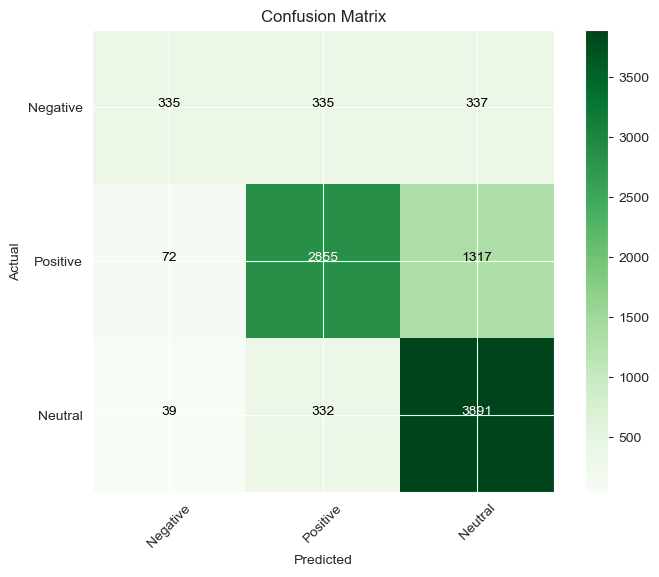

In [100]:
vectorizer = CountVectorizer()
X_train_vectorized = vectorizer.fit_transform(xTrain)

# Step 9: Train the Naive Bayes classifier
nb_classifier = MultinomialNB()
nb_classifier.fit(X_train_vectorized, yTrain)

# Step 10: Vectorize and predict sentiment for test data
X_test_vectorized = vectorizer.transform(xTest)
y_pred_nb = nb_classifier.predict(X_test_vectorized)

# Step 11: Evaluate the performance of the classifier
print('Accuracy :', accuracy_score(yTest, y_pred_nb))
print(metrics.classification_report(yTest, y_pred_nb))
plot_confusion_matrix(yTest, y_pred_nb)

# roBERTa

In [101]:
#load the model and tokenizer

model_path = "cardiffnlp/twitter-roberta-base-sentiment-latest"
tokenizer = AutoTokenizer.from_pretrained(model_path)
roberta_model = AutoModelForSequenceClassification.from_pretrained(model_path)

Some weights of the model checkpoint at cardiffnlp/twitter-roberta-base-sentiment-latest were not used when initializing RobertaForSequenceClassification: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
- This IS expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [102]:
# function that takes text and model to calculate the probability of each sentiment
def sentiment_analyzer(tweet,model):
    #return the output of PyTorch tensors
    encoded_tweet = tokenizer(tweet, return_tensors='pt')

    #calculate the sentiment
    output = model(**encoded_tweet)

    #returning a NumPy array containing the embeddings of scores
    scores = output[0][0].detach().numpy()
    #normalize the scores to probability
    probability = np.round(softmax(scores),3)

    #calculate the polarity by multiply each probability to its weight(Negative:-1, Neutral:0, Positive:1)
    #define weight vector
    polarity_weights = torch.tensor([-1, 0, 1])

    #construct the tensor of probability
    probability = torch.tensor(probability)

    #calculate the polartiy score
    polarity = polarity_weights*probability

    # sum the weighted probabilities along the last dimension
    polarity = polarity.sum(dim=-1)

    #Scale polarity score to range [-1, 1]
    polarity_scaled = torch.nn.Tanh()(polarity)

    return round(polarity_scaled.item(),4)

In [103]:
data_s=data[0:10].copy()

In [104]:
%%time
data_s['Polarity_ROB']=data_s['Tweet_lemmatized'].apply(lambda x: sentiment_analyzer(' '.join(x),roberta_model))

Wall time: 25.3 s


In [105]:
#as the roBERTa running will be quite long, will split the dataframe into chunks of 20k tweets each
n = 100  #chunk row size
list_df_2 = [data[i:(i + n)].copy() for i in range(0, data.shape[0], n)]

In [106]:
len(list_df_2)

476

In [ ]:
# the dataframe has been splitted into 41 groups with 20000 tweets and an extra one with the remainder (12924 tweets)
# will run the analysis over each one separately and then store in a csv file in case it crahses instead of redoing it again.
i = 146
for df in list_df_2[0:]:
    i = i+1
    df['Polarity_ROB'] = df['Tweet_lemmatized'].apply(lambda x: sentiment_analyzer(' '.join(x),roberta_model))
    df.to_csv('Data_rob_int/chunk_{}.csv'.format(i))
    #print('ok')

In [ ]:
import glob
#list all cvs file into a list
cvs_list = glob.glob('Data_rob_int/*.{}'.format('csv'))

#concat all csv files into one dataframe
df_sentiment_rob = pd.concat([pd.read_csv(file) for file in cvs_list])

In [ ]:
df_sentiment_rob['Sentiment_ROB'] = pd.cut(df_sentiment_rob['Polarity_ROB'], bins = [-1, -0.25, 0.25, 1], labels = ['Negative', 'Neutral', 'Positive'])

# LDA

#### Dictionary and Corpus for LDA

In [107]:
dictionary = Dictionary(data['Tweet_lemmatized'])
print(f'Total vocabulary size: {len(dictionary)}')

2023-05-28 12:21:29,426 : INFO : adding document #0 to Dictionary<0 unique tokens: []>
2023-05-28 12:21:29,665 : INFO : adding document #10000 to Dictionary<15735 unique tokens: ['2023', 'ai', 'aiwriting', 'amp', 'assistant']...>
2023-05-28 12:21:29,854 : INFO : adding document #20000 to Dictionary<23493 unique tokens: ['2023', 'ai', 'aiwriting', 'amp', 'assistant']...>
2023-05-28 12:21:30,041 : INFO : adding document #30000 to Dictionary<30336 unique tokens: ['2023', 'ai', 'aiwriting', 'amp', 'assistant']...>
2023-05-28 12:21:30,217 : INFO : adding document #40000 to Dictionary<36308 unique tokens: ['2023', 'ai', 'aiwriting', 'amp', 'assistant']...>
2023-05-28 12:21:30,355 : INFO : built Dictionary<40547 unique tokens: ['2023', 'ai', 'aiwriting', 'amp', 'assistant']...> from 47565 documents (total 640655 corpus positions)
2023-05-28 12:21:30,356 : INFO : Dictionary lifecycle event {'msg': "built Dictionary<40547 unique tokens: ['2023', 'ai', 'aiwriting', 'amp', 'assistant']...> from 4

Total vocabulary size: 40547


In [108]:
corpus = [dictionary.doc2bow(doc) for doc in data['Tweet_lemmatized']]

In [109]:
#create a dictionary to show the word and frequency in the corpus
dict_corpus = {}
for i in range(len(corpus)):
    for idx, freq in corpus[i]:
        if dictionary[idx] in dict_corpus:
            dict_corpus[dictionary[idx]] += freq
        else:
            dict_corpus[dictionary[idx]] = freq
df_dict = pd.DataFrame.from_dict(dict_corpus, orient='index', columns=['frequency'])

In [110]:
# Top 10 high-frequency words
df_dict.sort_values('frequency', ascending = False).head(20)

,frequency
chatgpt,49951
ai,13864
use,8630
like,4176
write,3670
get,3538
ask,3509
make,3285
prompt,2852
openai,2531


In [111]:
# Filter extreme words
dictionary.filter_extremes(no_below=10, no_above=0.5)  #words occur in less than 10 tweets, or more than 50% of tweets
print(f'Total vocabulary size: {len(dictionary)}')

2023-05-28 12:21:35,489 : INFO : discarding 35409 tokens: [('chatgpt', 45104), ('chal', 1), ('kumar', 5), ('phocuswire', 9), ('rajnish', 2), ('deformity', 1), ('foolish', 6), ('frontline', 1), ('aranara', 1), ('genshinimpact', 1)]...
2023-05-28 12:21:35,490 : INFO : keeping 5138 tokens which were in no less than 10 and no more than 23782 (=50.0%) documents
2023-05-28 12:21:35,527 : INFO : resulting dictionary: Dictionary<5138 unique tokens: ['2023', 'ai', 'aiwriting', 'amp', 'assistant']...>


Total vocabulary size: 5138


In [112]:
# Recreate the corpus for LDA model
corpus = [dictionary.doc2bow(doc) for doc in data['Tweet_lemmatized']]

In [113]:
# Re-check the top words
dict_corpus = {}
for i in range(len(corpus)):
    for idx, freq in corpus[i]:
        if dictionary[idx] in dict_corpus:
            dict_corpus[dictionary[idx]] += freq
        else:
            dict_corpus[dictionary[idx]] = freq
df_dict_new = pd.DataFrame.from_dict(dict_corpus, orient='index', columns=['frequency'])
df_dict_new.sort_values('frequency', ascending = False).head(20)

,frequency
ai,13864
use,8630
like,4176
write,3670
get,3538
ask,3509
make,3285
prompt,2852
openai,2531
new,2478


In [114]:
# Generate a test corpus
corpus_test = [dictionary.doc2bow(doc) for doc in data['Tweet_lemmatized'][0:1000]]

In [115]:
len(corpus),len(dictionary)

(47565, 5138)

#### Parameters

In [126]:
num_topics = 4
passes = 60
total_iteration = num_topics*passes

#### LDA Standard

In [127]:
start_time =time.time()
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.INFO)
# train the LdaModel
lda_model = LdaModel(corpus=corpus_test, id2word=dictionary, num_topics=num_topics, passes=passes)

end_time=time.time()
total_time = end_time - start_time
print(f"Total time taken: {total_time:.2f} seconds")

2023-05-28 13:45:53,297 : INFO : using symmetric alpha at 0.25
2023-05-28 13:45:53,299 : INFO : using symmetric eta at 0.25
2023-05-28 13:45:53,300 : INFO : using serial LDA version on this node
2023-05-28 13:45:53,303 : INFO : running online (multi-pass) LDA training, 4 topics, 60 passes over the supplied corpus of 1000 documents, updating model once every 1000 documents, evaluating perplexity every 1000 documents, iterating 50x with a convergence threshold of 0.001000
2023-05-28 13:45:53,795 : INFO : -10.281 per-word bound, 1244.3 perplexity estimate based on a held-out corpus of 1000 documents with 10976 words
2023-05-28 13:45:53,796 : INFO : PROGRESS: pass 0, at document #1000/1000
2023-05-28 13:45:54,195 : INFO : topic #0 (0.250): 0.015*"ai" + 0.009*"use" + 0.009*"ask" + 0.008*"get" + 0.007*"prompt" + 0.007*"make" + 0.006*"im" + 0.005*"time" + 0.005*"like" + 0.004*"question"
2023-05-28 13:45:54,196 : INFO : topic #1 (0.250): 0.018*"use" + 0.011*"ai" + 0.007*"ask" + 0.005*"course" 

Total time taken: 24.85 seconds


In [128]:
# Display topics
pprint(lda_model.show_topics(formatted=False))

[(0,
  [('ai', 0.01868731),
   ('prompt', 0.0127069615),
   ('get', 0.010142998),
   ('use', 0.009905925),
   ('make', 0.008268293),
   ('ask', 0.008085596),
   ('im', 0.007922938),
   ('people', 0.0063535287),
   ('time', 0.0058103),
   ('good', 0.0058073075)]),
 (1,
  [('use', 0.020818738),
   ('ai', 0.010566814),
   ('course', 0.007382856),
   ('ask', 0.006195417),
   ('udemy', 0.0052658427),
   ('would', 0.0052536097),
   ('u', 0.0048617306),
   ('3x', 0.004655293),
   ('amp', 0.004585589),
   ('openai', 0.0045701675)]),
 (2,
  [('ai', 0.019110942),
   ('use', 0.015038129),
   ('make', 0.007551345),
   ('write', 0.0068822834),
   ('find', 0.0050352323),
   ('get', 0.0044381763),
   ('try', 0.003596196),
   ('many', 0.0034625367),
   ('like', 0.003352764),
   ('tool', 0.003331201)]),
 (3,
  [('like', 0.007947061),
   ('ai', 0.006737636),
   ('write', 0.006007849),
   ('world', 0.0055001266),
   ('platform', 0.004785246),
   ('one', 0.004749724),
   ('think', 0.0042935587),
   ('new'

In [129]:
#Compute Coherence Score
cm = CoherenceModel(model=lda_model, corpus = corpus, coherence='c_v', texts=data['Tweet_lemmatized'])
coherence = cm.get_coherence()

print(f'Coherence score: {coherence}')

2023-05-28 13:46:18,171 : INFO : using ParallelWordOccurrenceAccumulator<processes=11, batch_size=64> to estimate probabilities from sliding windows
2023-05-28 13:46:33,990 : INFO : 11 accumulators retrieved from output queue
2023-05-28 13:46:34,016 : INFO : accumulated word occurrence stats for 58996 virtual documents


Coherence score: 0.4198166159649194


#### Optimal Topic Numbers

In [120]:
def model_coherence_generator(corpus, dictionary, data, start_topic, end_topic, step, passes):
    models = []
    coherence_scores = []
    for num in tqdm(range(start_topic, end_topic+1, step)):
        ldamodel = LdaModel(corpus=corpus, id2word=dictionary, num_topics=num, passes=passes)
        cv_coherence_model = CoherenceModel(model=ldamodel, corpus = corpus, coherence='c_v', texts=data)
        score = cv_coherence_model.get_coherence()

        coherence_scores.append(score)
        models.append(ldamodel)
    return models, coherence_scores

In [121]:
#Get the coherence scores by varing the number of topics from 2 to 40 with step=2
lda_models, coherence_scores = model_coherence_generator(corpus, dictionary, data['Tweet_lemmatized'], start_topic=2, end_topic=40, step=2, passes=10)

  0%|          | 0/20 [00:00<?, ?it/s]2023-05-28 12:22:30,854 : INFO : using symmetric alpha at 0.5
2023-05-28 12:22:30,855 : INFO : using symmetric eta at 0.5
2023-05-28 12:22:30,856 : INFO : using serial LDA version on this node
2023-05-28 12:22:30,858 : INFO : running online (multi-pass) LDA training, 2 topics, 10 passes over the supplied corpus of 47565 documents, updating model once every 2000 documents, evaluating perplexity every 20000 documents, iterating 50x with a convergence threshold of 0.001000
2023-05-28 12:22:30,859 : INFO : PROGRESS: pass 0, at document #2000/47565
2023-05-28 12:22:33,395 : INFO : merging changes from 2000 documents into a model of 47565 documents
2023-05-28 12:22:33,396 : INFO : topic #0 (0.500): 0.025*"use" + 0.019*"ai" + 0.008*"make" + 0.007*"get" + 0.006*"ask" + 0.006*"question" + 0.006*"amp" + 0.005*"prompt" + 0.005*"write" + 0.005*"like"
2023-05-28 12:22:33,397 : INFO : topic #1 (0.500): 0.027*"ai" + 0.010*"like" + 0.009*"get" + 0.009*"write" + 0.

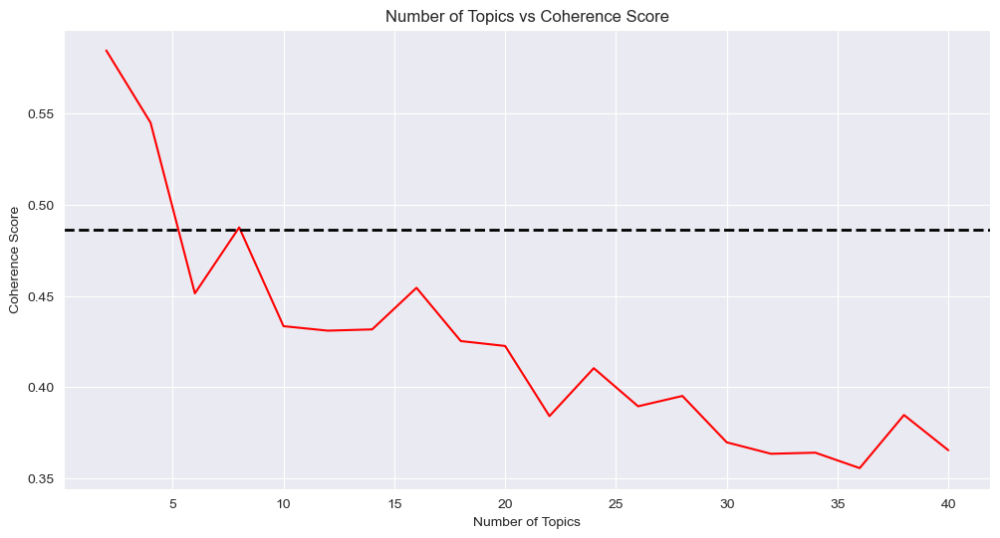

In [122]:
#Plot the number of topics vs coherence score
x_ax = range(2, 41, 2)
y_ax = coherence_scores
plt.figure(figsize=(12, 6))
plt.plot(x_ax, y_ax, c='r')
plt.axhline(y=0.486, c='k', linestyle='--', linewidth=2)
plt.rcParams['figure.facecolor'] = 'white'
plt.title('Number of Topics vs Coherence Score')
xl = plt.xlabel('Number of Topics')
yl = plt.ylabel('Coherence Score')
plt.show()

#### Optimal Iteration

In [123]:
#Iterate LdaMulticore model over varing passes
def model_coherence_generator_2(corpus, dictionary, data, passes):
    ldamodel = LdaModel(corpus=corpus, id2word=dictionary, num_topics=10, passes=passes, random_state=42)
    cv_coherence_model = CoherenceModel(model=ldamodel, corpus = corpus, coherence='c_v', texts=data)
    score = cv_coherence_model.get_coherence()
    return ldamodel, score

models = []
coherence_scores = []
for passes in tqdm([1, 5, 10, 20, 40, 60, 80, 100]):
    model, score = model_coherence_generator_2(corpus, dictionary, data['Tweet_lemmatized'], passes)
    models.append(model)
    coherence_scores.append(score)

  0%|          | 0/8 [00:00<?, ?it/s]2023-05-28 12:57:28,641 : INFO : using symmetric alpha at 0.1
2023-05-28 12:57:28,642 : INFO : using symmetric eta at 0.1
2023-05-28 12:57:28,643 : INFO : using serial LDA version on this node
2023-05-28 12:57:28,650 : INFO : running online (single-pass) LDA training, 10 topics, 1 passes over the supplied corpus of 47565 documents, updating model once every 2000 documents, evaluating perplexity every 20000 documents, iterating 50x with a convergence threshold of 0.001000
2023-05-28 12:57:28,652 : INFO : PROGRESS: pass 0, at document #2000/47565
2023-05-28 12:57:29,279 : INFO : merging changes from 2000 documents into a model of 47565 documents
2023-05-28 12:57:29,282 : INFO : topic #9 (0.100): 0.020*"ai" + 0.013*"write" + 0.012*"use" + 0.012*"make" + 0.010*"openai" + 0.010*"ask" + 0.009*"via" + 0.008*"forward" + 0.007*"move" + 0.007*"like"
2023-05-28 12:57:29,283 : INFO : topic #7 (0.100): 0.017*"ai" + 0.015*"like" + 0.008*"use" + 0.008*"ask" + 0.00

In [124]:
coherence_scores

[0.46324441551865475,
 0.47391122623820364,
 0.47102156244028937,
 0.4651164588457341,
 0.46434342561732295,
 0.4686229716433436,
 0.4617319301460676,
 0.46198142550340726]

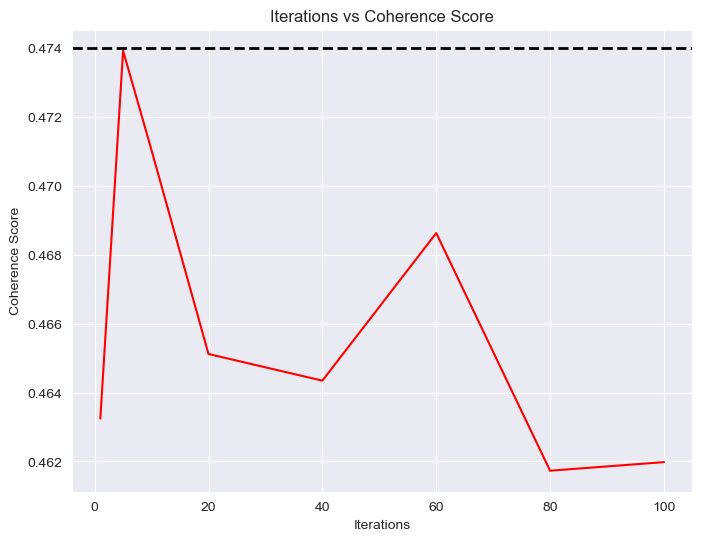

In [125]:
#Plot the iteration times vs coherence score
x_ax = [1, 5, 10, 20, 40, 60, 80, 100]
y_ax = coherence_scores
plt.figure(figsize=(8, 6))
plt.plot(x_ax, y_ax, c='r')
plt.axhline(y= 0.474, c='k', linestyle='--', linewidth=2)
plt.rcParams['figure.facecolor'] = 'white'
plt.title('Iterations vs Coherence Score')
xl = plt.xlabel('Iterations')
yl = plt.ylabel('Coherence Score')
plt.show()

#### Identificaton of Topics

In [130]:
#get the topic distribution for each tweets
topic_dist = [lda_model[doc] for doc in corpus]

In [131]:
#get the dominant topic and the score
dominant_topic = [max(topic, key=lambda x:x[1])[0] for topic in topic_dist]
scores =[max(topic, key=lambda x:x[1])[1] for topic in topic_dist]

In [132]:
#Create a dataframe to show dominant topic for each tweet
df_topic = data[['Tweet_lemmatized','Tokens']].copy()
df_topic['Dominant_Topic'] = [topic+1 for topic in dominant_topic]
df_topic['Contribution%'] = [round(score*100,2) for score in scores]
df_topic.head()

,Tweet_lemmatized,Tokens,Dominant_Topic,Contribution%
0,"[best, ai, write, assistant, 2023, chatgpt, am...",best ai write assistant 2023 chatgpt amp bingc...,3,95.62
1,"[rt, interview, phocuswire, rajnish, kumar, co...",rt interview phocuswire rajnish kumar cofounde...,1,95.72
2,"[discuss, internet, chatgpt, ai, deformity, di...",discuss internet chatgpt ai deformity discours...,3,92.88
3,"[late, ai, news, dont, want, sad, poor, respon...",late ai news dont want sad poor response bos d...,3,95.86
4,"[well, say, u, frontline, implementation, brid...",well say u frontline implementation bridge gap...,3,69.76


In [133]:
# Count and percentage of tweets for each topic
df_topic_summary = df_topic.groupby('Dominant_Topic').agg({'Tokens':'count'}).copy().reset_index()
df_topic_summary.rename(columns={'Tokens':'Total_tweet'}, inplace=True)
df_topic_summary['Percentage%'] = round(df_topic_summary['Total_tweet']/df_topic.shape[0]*100,2)
df_topic_summary=df_topic_summary.sort_values('Total_tweet', ascending=False).reset_index(drop=True)
df_topic_summary

,Dominant_Topic,Total_tweet,Percentage%
0,1,25123,52.82
1,3,9037,19.00
2,2,7696,16.18
3,4,5699,11.98


In [134]:
#To sort the highly relevant tweets for each topics and interprete the topic names.
df_topic[df_topic['Dominant_Topic']==2].sort_values('Contribution%', ascending=False)[0:100]
df_topic['Dominant_Topic'].value_counts()

1    25123
3     9037
2     7696
4     5709
Name: Dominant_Topic, dtype: int64

In [135]:
#Summarize the topic names based on each topics' top terms and highly-relevant tweets
names = {1:"T1 AI and Prompt Usage",
        2:"T2 AI and Online Courses",
        3:"T3 AI Tools and Writing",
        4:"T4 AI and Messaging/Chat",
        }

In [136]:
df_topic['Topic_Name'] = df_topic['Dominant_Topic'].map(names)

In [137]:
#creat a topic dataframe
topics = [[(term, round(weight,3)) for term, weight in lda_model.show_topic(n,topn=20)] for n in range(0,lda_model.num_topics)]

In [138]:
pd.set_option('display.max_colwidth', None)
topic_df = pd.DataFrame({'Topic_Name':names.values(),
                         'Topic_Terms':[','.join([term for term, weight in topic]) for topic in topics]},
                        index = ['Topic ' + str(n) for n in range(1,lda_model.num_topics+1)])
# apply style to align content to the left
topic_df

,Topic_Name,Topic_Terms
Topic 1,T1 AI and Prompt Usage,"ai,prompt,get,use,make,ask,im,people,time,good,back,question,work,like,doctor,well,think,want,give,answer"
Topic 2,T2 AI and Online Courses,"use,ai,course,ask,udemy,would,u,3x,amp,openai,1,try,language,learn,via,code,model,want,midjourney,please"
Topic 3,T3 AI Tools and Writing,"ai,use,make,write,find,get,try,many,like,tool,new,amp,ive,0,need,news,ask,take,right,give"
Topic 4,T4 AI and Messaging/Chat,"like,ai,write,world,platform,one,think,new,message,chatgpt4,look,get,still,issue,video,whats,3,make,im,human"


In [139]:
df_temp = df_topic_summary.sort_values('Dominant_Topic')
topic_df['Tweet_count'] = df_temp['Total_tweet'].values
topic_df

,Topic_Name,Topic_Terms,Tweet_count
Topic 1,T1 AI and Prompt Usage,"ai,prompt,get,use,make,ask,im,people,time,good,back,question,work,like,doctor,well,think,want,give,answer",25123
Topic 2,T2 AI and Online Courses,"use,ai,course,ask,udemy,would,u,3x,amp,openai,1,try,language,learn,via,code,model,want,midjourney,please",7696
Topic 3,T3 AI Tools and Writing,"ai,use,make,write,find,get,try,many,like,tool,new,amp,ive,0,need,news,ask,take,right,give",9037
Topic 4,T4 AI and Messaging/Chat,"like,ai,write,world,platform,one,think,new,message,chatgpt4,look,get,still,issue,video,whats,3,make,im,human",5699


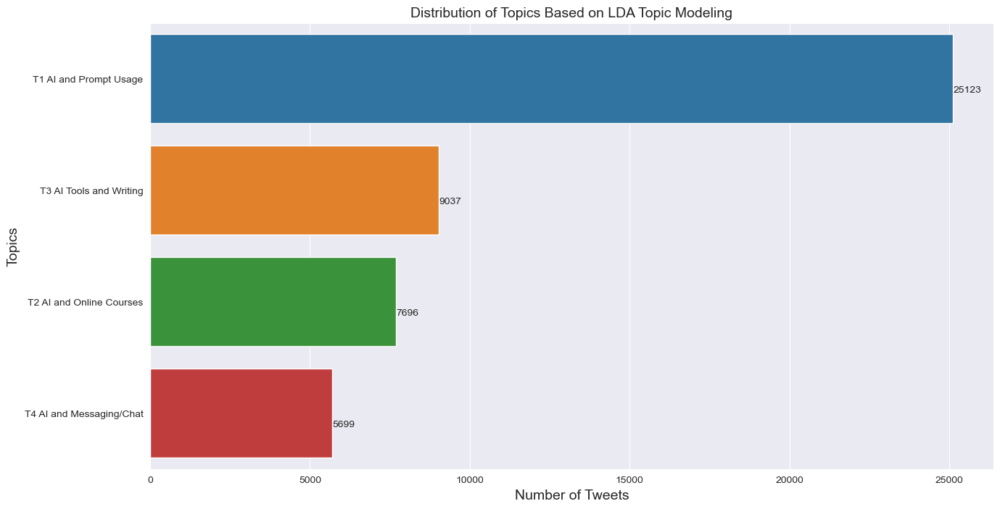

In [140]:
#plot a bar chart to show the number of tweets for each topic
sort_name = topic_df.sort_values('Tweet_count',ascending=False)['Topic_Name'].to_list()
fig,ax = plt.subplots(1,1,figsize=(15,8))
ax = sns.barplot(y=topic_df['Topic_Name'], x=topic_df['Tweet_count'], order=sort_name, palette='tab10')
for i in ax.patches:
    ax.annotate(int(i.get_width()), (i.get_width(), i.get_y()+0.5), va='center')
ax.set_ylabel('Topics', size=14)
ax.set_xlabel('Number of Tweets', size=14)
ax.set_title('Distribution of Topics Based on LDA Topic Modeling', size=14)

plt.show()

# VADER vs roBERTa

In [150]:
#data_rob = pd.read_csv('sentiment_analysis_results_gpt.csv')
data_2 = df_topic[0:47500].copy()

df_sentiment_rob['Sentiment_ROBERTA'] = pd.cut(df_sentiment_rob['Polarity_ROB'], bins = [-1, -0.25, 0.25, 1], labels = ['Negative', 'Neutral', 'Positive'])

df_sentiment_rob.reset_index(drop=True, inplace=True)

data_2['Polarity_ROBERTA'] = df_sentiment_rob['Polarity_ROB']
data_2['Sentiment_ROBERTA'] = df_sentiment_rob['Sentiment_ROBERTA']

#data.drop('Sentiment_lemm_spacy', axis=1, inplace=True)
#data.drop('Tweet_lemmatized_spacy', axis=1, inplace=True)
data_2.rename(columns={'Sentiment_lemm': 'Sentiment_VADER'}, inplace=True)
data_2['Polarity_VADER'] = data_2['Tweet_lemmatized'].apply(lambda x: sia.polarity_scores(' '.join(x)))
data_2['Polarity_VADER'] = data_2['Polarity_VADER'].apply(lambda x: x['compound'])
data_2['Sentiment_VADER'] = data_2['Tweet_lemmatized'].apply(labeller)
data_2

,Tweet_lemmatized,Tokens,Dominant_Topic,Contribution%,Topic_Name,Polarity_ROBERTA,Sentiment_ROBERTA,Polarity_VADER,Sentiment_VADER
0,"[best, ai, write, assistant, 2023, chatgpt, amp, bingchat, integrated, gpt4, try, free, see, one, work, best, aiwriting, contentcreation]",best ai write assistant 2023 chatgpt amp bingchat integrated gpt4 try free see one work best aiwriting contentcreation,3,95.62,T3 AI Tools and Writing,0.5850,Positive,0.9136,Positive
1,"[rt, interview, phocuswire, rajnish, kumar, cofounder, group, chief, product, technology, officer, speak, companys, early, artificialintelligence, development, potential, use, case, chatgpt, current, chal]",rt interview phocuswire rajnish kumar cofounder group chief product technology officer speak companys early artificialintelligence development potential use case chatgpt current chal,1,95.72,T1 AI and Prompt Usage,0.0599,Neutral,0.0000,Neutral
2,"[discuss, internet, chatgpt, ai, deformity, discourse, likely, drive, social, medium, matter, doom]",discuss internet chatgpt ai deformity discourse likely drive social medium matter doom,3,92.88,T3 AI Tools and Writing,-0.4960,Negative,-0.3818,Negative
3,"[late, ai, news, dont, want, sad, poor, response, bos, demand, extra, shift, use, chatgpt, write, formal, email, behalf, decline]",late ai news dont want sad poor response bos demand extra shift use chatgpt write formal email behalf decline,3,95.86,T3 AI Tools and Writing,-0.7168,Negative,0.5245,Positive
4,"[well, say, u, frontline, implementation, bridge, gap, would, foolish, u, expect, figure, ive, see, demand, prediction, model, chatgpt, make, go, crazy, hype, haha]",well say u frontline implementation bridge gap would foolish u expect figure ive see demand prediction model chatgpt make go crazy hype haha,3,69.76,T3 AI Tools and Writing,0.1253,Neutral,0.0258,Neutral
...,...,...,...,...,...,...,...,...,...
47495,"[girl, godbless, chatgpt]",girl godbless chatgpt,4,62.48,T4 AI and Messaging/Chat,-0.2022,Neutral,0.0000,Neutral
47496,"[want, chat, history, train, chatgpt, llm, want, depersonalize, knowledge, help, others, tell, regulator]",want chat history train chatgpt llm want depersonalize knowledge help others tell regulator,1,60.37,T1 AI and Prompt Usage,0.1596,Neutral,0.5106,Positive
47497,"[openai, let, disable, chatgpt, history, conversation, arent, use, train, ai, model, here]",openai let disable chatgpt history conversation arent use train ai model here,2,48.92,T2 AI and Online Courses,0.0240,Neutral,0.0000,Neutral
47498,"[change, profile, picture, lose, blue, mark, open, chatgpt, plugins, ohh, yeah]",change profile picture lose blue mark open chatgpt plugins ohh yeah,3,38.02,T3 AI Tools and Writing,0.0679,Neutral,-0.1280,Neutral


In [151]:
#Random samples that VADER and ROBERTA models gave different sentiment output
data_2[data_2['Sentiment_ROBERTA']!=data_2['Sentiment_VADER']].sample(100)

,Tweet_lemmatized,Tokens,Dominant_Topic,Contribution%,Topic_Name,Polarity_ROBERTA,Sentiment_ROBERTA,Polarity_VADER,Sentiment_VADER
39902,[chatgpt],chatgpt,1,25.00,T1 AI and Prompt Usage,0.7461,Positive,0.0000,Neutral
12513,"[new, privacy, feature, chatgpt, back]",new privacy feature chatgpt back,1,84.52,T1 AI and Prompt Usage,-0.7240,Negative,0.0000,Neutral
36453,"[chatgpt, generative, ai, around, world, maturity, opportunity, hurdle, key, region]",chatgpt generative ai around world maturity opportunity hurdle key region,3,70.89,T3 AI Tools and Writing,-0.6533,Negative,0.4215,Positive
29681,"[ho, see, could, interest, ask, chatgpt, make, story, soldier, hehehe]",ho see could interest ask chatgpt make story soldier hehehe,1,90.15,T1 AI and Prompt Usage,0.0549,Neutral,0.4588,Positive
29387,"[shout, recruiter, also, let, go, prior, layoff, give, ridiculously, good, resume, feedback, bunch, online, job, posting, inspire, chatgpt, time, actually, thanks, fuck, asshole, fire]",shout recruiter also let go prior layoff give ridiculously good resume feedback bunch online job posting inspire chatgpt time actually thanks fuck asshole fire,1,56.45,T1 AI and Prompt Usage,0.0917,Neutral,0.2960,Positive
...,...,...,...,...,...,...,...,...,...
27849,"[pleasure, host, roundtable, discussion, education, ai, era, recently, academic, integrity, expert, intervention, relevant, constructive, replay, available, ai, aicontent, chatgpt]",pleasure host roundtable discussion education ai era recently academic integrity expert intervention relevant constructive replay available ai aicontent chatgpt,2,33.03,T2 AI and Online Courses,-0.1036,Neutral,0.7430,Positive
12087,"[opensourcing, allow, hug, face, foster, collaboration, among, researcher, amp, company, propel, launch, chatgpt, tip, point, ai, shift, niche, mainstream, opensource, machinelearning]",opensourcing allow hug face foster collaboration among researcher amp company propel launch chatgpt tip point ai shift niche mainstream opensource machinelearning,3,60.64,T3 AI Tools and Writing,-0.2692,Negative,0.6124,Positive
39932,"[ask, chatgpt, would, date, think, try, let, easy]",ask chatgpt would date think try let easy,4,76.81,T4 AI and Messaging/Chat,-0.1411,Neutral,0.4404,Positive
28617,"[head, im, launch, free, chatgpt, guide, writer, april, 29th, grab, first, chapter, join]",head im launch free chatgpt guide writer april 29th grab first chapter join,1,49.49,T1 AI and Prompt Usage,-0.4653,Negative,0.6705,Positive


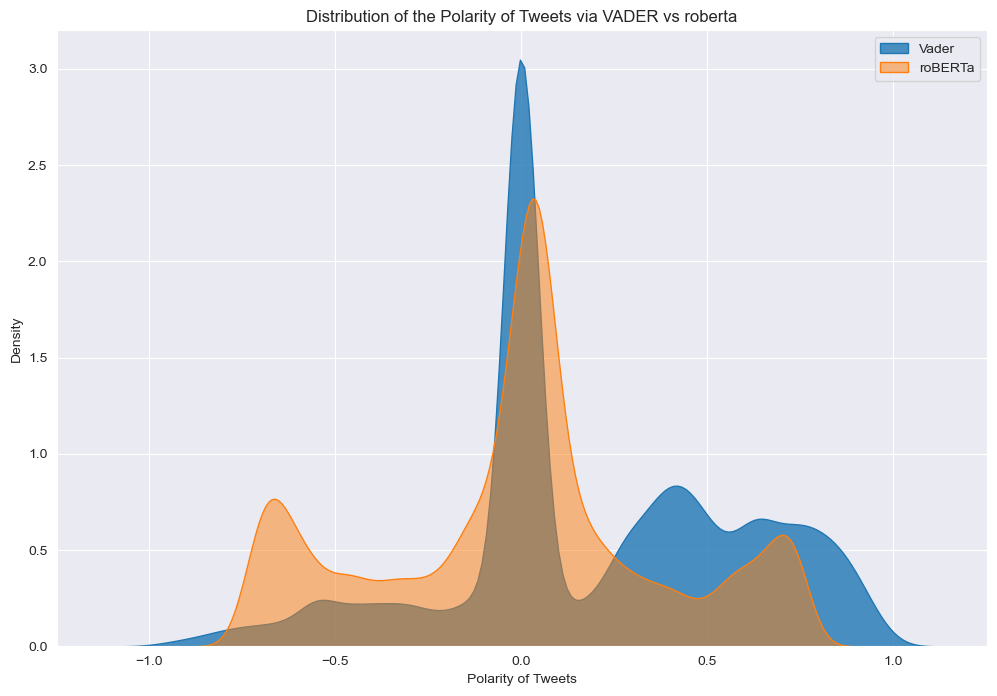

In [152]:
import seaborn as sns
fig, ax = plt.subplots(1,1, figsize=(12,8))
sns.kdeplot(data_2['Polarity_VADER'],shade=True, legend='Vader', alpha=0.8)
ax = sns.kdeplot(data_2['Polarity_ROBERTA'], shade=True, legend='roBERTa', alpha=0.5)
ax.set_xlabel('Polarity of Tweets')
ax.set_title('Distribution of the Polarity of Tweets via VADER vs roberta')
plt.legend(['Vader','roBERTa'])
plt.show()

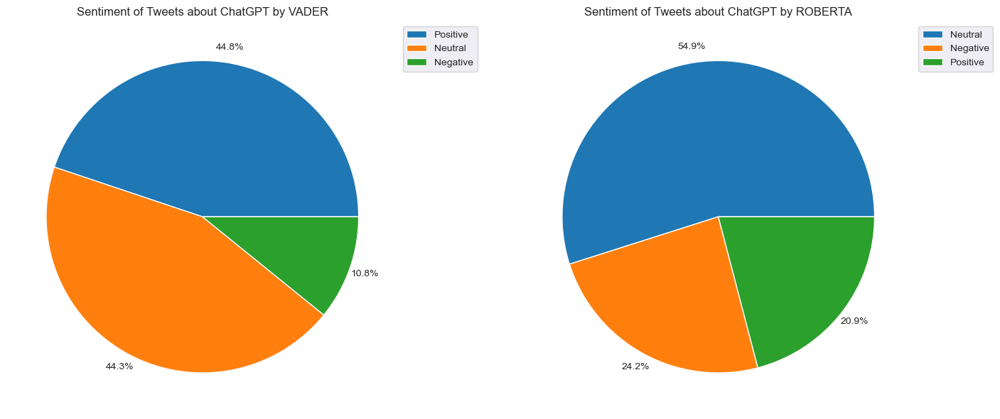

In [153]:
sns.set_palette('tab10')
fig,ax=plt.subplots(1,2,figsize=(15,6))
plt.subplot(1,2,1)
pie_1 = data_2['Sentiment_VADER'].value_counts()
plt.pie(pie_1, autopct="%.1f%%", pctdistance=1.1)
plt.legend(labels = pie_1.index,
          bbox_to_anchor=[1,1])
plt.title('Sentiment of Tweets about ChatGPT by VADER')

plt.subplot(1,2,2)
pie_2 = data_2['Sentiment_ROBERTA'].value_counts()
plt.pie(pie_2, autopct="%.1f%%", pctdistance=1.1)
plt.legend(labels = pie_2.index,
          bbox_to_anchor=[1,1])
plt.title('Sentiment of Tweets about ChatGPT by ROBERTA')

plt.tight_layout()
plt.show()

In [154]:
#PER FARE QUESTO DOVREI AVERE ROBERTA SUL JUPY


#Test the process time of VADER and ROBERTA using a dataframe with 1000 samples.
df_test = data[0:1000].copy()

#VADER process
start = time.time()
df_test['Polarity_VADER'] = df_test['Tweet_lemmatized'].apply(lambda x: sia.polarity_scores(' '.join(x))['compound'])
end = time.time()
t1 = end-start

start = time.time()
df_test['Polarity_ROB'] = df_test['Tweet_lemmatized'].apply(lambda x: sentiment_analyzer(' '.join(x),roberta_model))
end = time.time()
t2 = end-start
print(f'To predict sentiment of 5000 tweets, VADER used {round(t1,2)}s, while ROBERTA used {round(t2,2)}s.')

KeyboardInterrupt: 

# EDA Sentiment of Tweets Topics

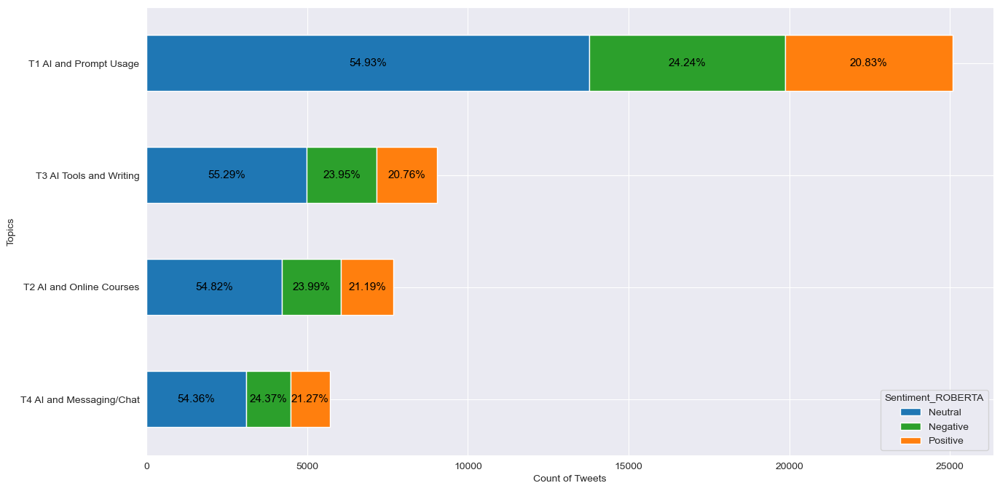

In [158]:
# Sentiment of each topic

topic_sen = data_2.groupby('Topic_Name')['Sentiment_ROBERTA'].value_counts().unstack().reset_index()
#sort by the popularity of the topics (total count)
topic_sen['Total']=topic_sen['Negative']+topic_sen['Neutral']+topic_sen['Positive']
topic_sen = topic_sen.sort_values('Total')
topic_sen=topic_sen.drop(columns='Total')
topic_sen = topic_sen.set_index('Topic_Name')

ax=topic_sen.plot(kind='barh',stacked='True', color=['#1f77b4', '#ff7f0e', '#2ca02c'], figsize=(15,8))
#get the percentage of each sentiment in specific topic
percentages = topic_sen.div(topic_sen.sum(axis=1), axis=0)
percentages = percentages.reset_index().melt('Topic_Name', var_name='Sentiment', value_name='Percentage')
#label the percentage of each sentiment
for i, patch in enumerate(ax.patches):
    ax.text(patch.get_x()+patch.get_width()/2,
            patch.get_y()+0.25,
            f'{round(percentages.loc[i,"Percentage"]*100,2)}%',
            ha='center', va='center',
            color='black', fontsize=11)
ax.set_xlabel('Count of Tweets')
ax.set_ylabel('Topics')
plt.show()

# Wordcloud

C:\Users\lucac\anaconda3\lib\site-packages\wordcloud\wordcloud.py:519: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = (Image.ROTATE_90 if orientation is None else
C:\Users\lucac\anaconda3\lib\site-packages\wordcloud\wordcloud.py:519: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = (Image.ROTATE_90 if orientation is None else
C:\Users\lucac\anaconda3\lib\site-packages\wordcloud\wordcloud.py:499: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = Image.ROTATE_90
C:\Users\lucac\anaconda3\lib\site-packages\wordcloud\wordcloud.py:499: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = Image.ROTATE_90
C:\Users\lucac\anaconda3\lib\site-

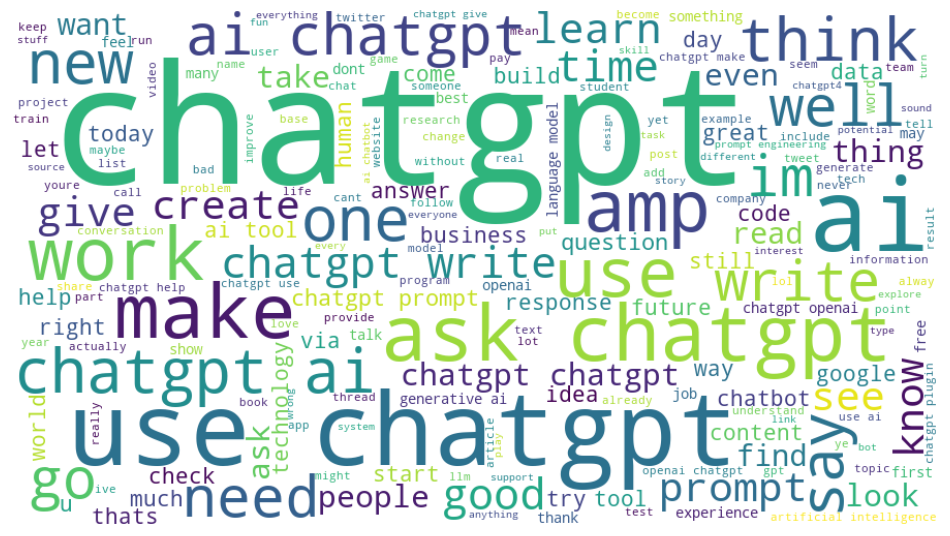

In [164]:
import pandas as pd
from wordcloud import WordCloud
from nltk.corpus import stopwords
import matplotlib.pyplot as plt

# CSV file containing tweets with a 'text' column in our case tokens column
#df = pd.read_csv('/Twitter_Dataset_Processed.csv')

#to convert the text that had floats to str, withot this code in our case we got an error
data['Tokens'] = data['Tokens'].astype(str)
# Concatenate all tweets into a single string
text = ' '.join(set(data['Tokens']))

# Define the stop words, I adjusted them with the stowords that weren't relevant every time I run the code
stopwords = set(stopwords.words('english'))

stopwords.update(["chatgpt","ChatGPT", "use","ai","openai"])  # Add the words you want to exclude from the word cloud

# Create the WordCloud object
wordcloud = WordCloud(width=900, height=500, background_color='white').generate(text)

# Plot the word cloud
plt.figure(figsize=(12, 8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

#positive words such as great,love,best,free,idea,learn,help and so on confirm the result that we obtained from
#the lammanization, positive results. For obvious reasons and as expected, the word chatgpt is included in every row in the Tokens column
#since we used tweets containing this word. It still shows up even if added to the stopwords list, to solve
#this problem, it can be manually removed if the size of the dataset allows it, which is not our case.
